In [137]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
BASE_DIR = "/content/drive/MyDrive/Satellite_Property_Valuation"

In [ ]:
DATA_PATH = f"{BASE_DIR}/data/train(1)(train(1)).csv"
df = pd.read_csv(DATA_PATH)

df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,9117000170,20150505T000000,268643,4,2.25,1810,9240,2.0,0,0,...,7,1810,0,1961,0,98055,47.4362,-122.187,1660,9240
1,6700390210,20140708T000000,245000,3,2.50,1600,2788,2.0,0,0,...,7,1600,0,1992,0,98031,47.4034,-122.187,1720,3605
2,7212660540,20150115T000000,200000,4,2.50,1720,8638,2.0,0,0,...,8,1720,0,1994,0,98003,47.2704,-122.313,1870,7455
3,8562780200,20150427T000000,352499,2,2.25,1240,705,2.0,0,0,...,7,1150,90,2009,0,98027,47.5321,-122.073,1240,750
4,7760400350,20141205T000000,232000,3,2.00,1280,13356,1.0,0,0,...,7,1280,0,1994,0,98042,47.3715,-122.074,1590,8071


In [ ]:
df.shape

(16209, 21)

In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16209 entries, 0 to 16208
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             16209 non-null  int64  
 1   date           16209 non-null  object 
 2   price          16209 non-null  int64  
 3   bedrooms       16209 non-null  int64  
 4   bathrooms      16209 non-null  float64
 5   sqft_living    16209 non-null  int64  
 6   sqft_lot       16209 non-null  int64  
 7   floors         16209 non-null  float64
 8   waterfront     16209 non-null  int64  
 9   view           16209 non-null  int64  
 10  condition      16209 non-null  int64  
 11  grade          16209 non-null  int64  
 12  sqft_above     16209 non-null  int64  
 13  sqft_basement  16209 non-null  int64  
 14  yr_built       16209 non-null  int64  
 15  yr_renovated   16209 non-null  int64  
 16  zipcode        16209 non-null  int64  
 17  lat            16209 non-null  float64
 18  long  

In [ ]:
'''
The dataset contains ~16k residential properties, each described by structural, locational, and geographic features.

Both numerical and spatial features (latitude, longitude) are present, making the problem suitable for multimodal learning.
'''

'\nThe dataset contains ~16k residential properties, each described by structural, locational, and geographic features.\n\nBoth numerical and spatial features (latitude, longitude) are present, making the problem suitable for multimodal learning.\n'

In [ ]:
pd.options.display.float_format = '{:.2f}'.format

In [ ]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00
mean,4575770827.16,537470.28,3.37,2.11,2073.27,14867.67,1.50,0.01,0.23,3.41,7.65,1784.75,288.52,1971.15,82.74,98077.97,47.56,-122.21,1983.15,12735.57
std,2874661405.39,360303.58,0.93,0.77,907.01,38825.70,0.54,0.08,0.76,0.65,1.17,821.82,438.60,29.37,397.86,53.36,0.14,0.14,681.91,26933.16
min,1000102.00,75000.00,0.00,0.00,290.00,520.00,1.00,0.00,0.00,1.00,1.00,290.00,0.00,1900.00,0.00,98001.00,47.16,-122.52,399.00,651.00
25%,2123049194.00,320000.00,3.00,1.50,1430.00,5004.00,1.00,0.00,0.00,3.00,7.00,1200.00,0.00,1952.00,0.00,98033.00,47.47,-122.33,1480.00,5098.00
50%,3904950190.00,450000.00,3.00,2.25,1910.00,7599.00,1.50,0.00,0.00,3.00,7.00,1560.00,0.00,1975.00,0.00,98065.00,47.57,-122.23,1840.00,7620.00
75%,7304301005.00,640000.00,4.00,2.50,2550.00,10631.00,2.00,0.00,0.00,4.00,8.00,2200.00,560.00,1997.00,0.00,98117.00,47.68,-122.12,2360.00,10053.00
max,9900000190.00,7700000.00,33.00,8.00,12050.00,1164794.00,3.50,1.00,4.00,5.00,13.00,8860.00,4820.00,2015.00,2015.00,98199.00,47.78,-121.31,6210.00,871200.00


In [ ]:
df["price"].describe()

,price
count,16209.00
mean,537470.28
std,360303.58
min,75000.00
25%,320000.00
50%,450000.00
75%,640000.00
max,7700000.00


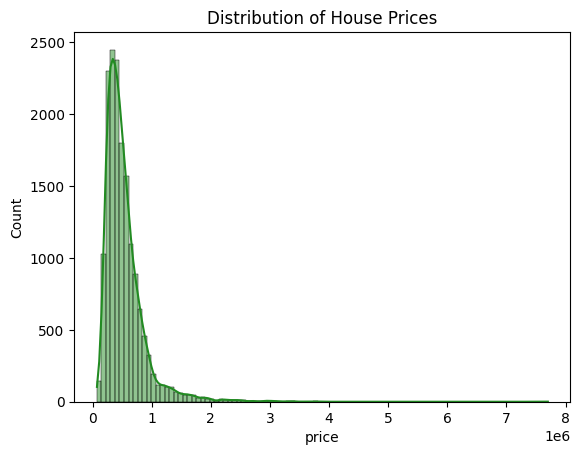

In [ ]:
# plt.figure(figsize=(10, 5.625), dpi=300)
sns.histplot(df["price"], bins=100, kde=True, color="#228B22")
plt.title("Distribution of House Prices")
plt.show()


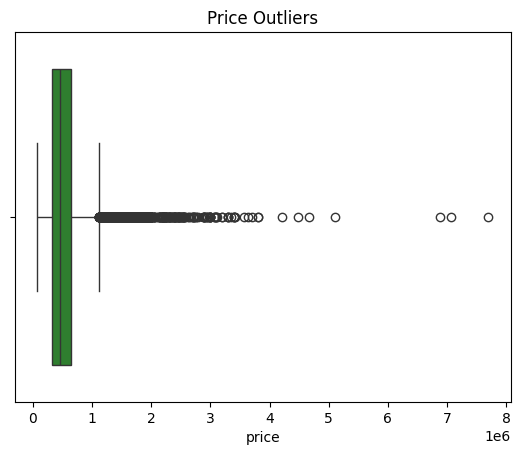

In [ ]:
# plt.figure(figsize=(10, 5.625), dpi=300)
sns.boxplot(x=df["price"], color="#228B22")
plt.title("Price Outliers")
plt.show()

In [ ]:
'''
House prices are strongly right-skewed, indicating the presence of high-value luxury properties.

A small fraction of properties dominate the upper price range, which can bias regression models.

This motivates the use of log-transformed price as the prediction target.
'''

'\nHouse prices are strongly right-skewed, indicating the presence of high-value luxury properties.\n\nA small fraction of properties dominate the upper price range, which can bias regression models.\n\nThis motivates the use of log-transformed price as the prediction target.\n'

In [ ]:
'''
“The target variable exhibits a heavy right skew with significant outliers, motivating the use of log-price transformation to stabilize variance and improve model learning.”
'''

'\n“The target variable exhibits a heavy right skew with significant outliers, motivating the use of log-price transformation to stabilize variance and improve model learning.”\n'

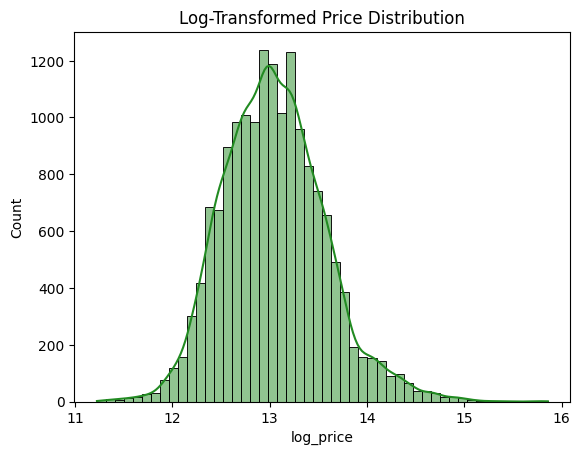

In [ ]:
df["log_price"] = np.log1p(df["price"])

# plt.figure(figsize=(10, 5.625), dpi=300)
sns.histplot(df["log_price"], bins=50, kde=True, color="#228B22")
plt.title("Log-Transformed Price Distribution")
plt.show()


In [ ]:
'''
Log transformation produces a near-normal distribution.

This improves:

gradient stability

convergence

robustness to outliers
'''

'\nLog transformation produces a near-normal distribution.\n\nThis improves:\n\ngradient stability\n\nconvergence\n\nrobustness to outliers\n'

In [ ]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'log_price'],
      dtype='object')

In [ ]:
num_cols = [
    "sqft_living", "sqft_lot", "bedrooms", "bathrooms",
    "floors", "grade", "view", "condition"
]

df[num_cols].describe()


,sqft_living,sqft_lot,bedrooms,bathrooms,floors,grade,view,condition
count,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00
mean,2073.27,14867.67,3.37,2.11,1.50,7.65,0.23,3.41
std,907.01,38825.70,0.93,0.77,0.54,1.17,0.76,0.65
min,290.00,520.00,0.00,0.00,1.00,1.00,0.00,1.00
25%,1430.00,5004.00,3.00,1.50,1.00,7.00,0.00,3.00
50%,1910.00,7599.00,3.00,2.25,1.50,7.00,0.00,3.00
75%,2550.00,10631.00,4.00,2.50,2.00,8.00,0.00,4.00
max,12050.00,1164794.00,33.00,8.00,3.50,13.00,4.00,5.00


In [ ]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,log_price
count,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,...,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00,16209.00
mean,4575770827.16,537470.28,3.37,2.11,2073.27,14867.67,1.50,0.01,0.23,3.41,...,1784.75,288.52,1971.15,82.74,98077.97,47.56,-122.21,1983.15,12735.57,13.05
std,2874661405.39,360303.58,0.93,0.77,907.01,38825.70,0.54,0.08,0.76,0.65,...,821.82,438.60,29.37,397.86,53.36,0.14,0.14,681.91,26933.16,0.52
min,1000102.00,75000.00,0.00,0.00,290.00,520.00,1.00,0.00,0.00,1.00,...,290.00,0.00,1900.00,0.00,98001.00,47.16,-122.52,399.00,651.00,11.23
25%,2123049194.00,320000.00,3.00,1.50,1430.00,5004.00,1.00,0.00,0.00,3.00,...,1200.00,0.00,1952.00,0.00,98033.00,47.47,-122.33,1480.00,5098.00,12.68
50%,3904950190.00,450000.00,3.00,2.25,1910.00,7599.00,1.50,0.00,0.00,3.00,...,1560.00,0.00,1975.00,0.00,98065.00,47.57,-122.23,1840.00,7620.00,13.02
75%,7304301005.00,640000.00,4.00,2.50,2550.00,10631.00,2.00,0.00,0.00,4.00,...,2200.00,560.00,1997.00,0.00,98117.00,47.68,-122.12,2360.00,10053.00,13.37
max,9900000190.00,7700000.00,33.00,8.00,12050.00,1164794.00,3.50,1.00,4.00,5.00,...,8860.00,4820.00,2015.00,2015.00,98199.00,47.78,-121.31,6210.00,871200.00,15.86


In [ ]:

continuous_cols = [
    "sqft_living",
    "sqft_lot"
]

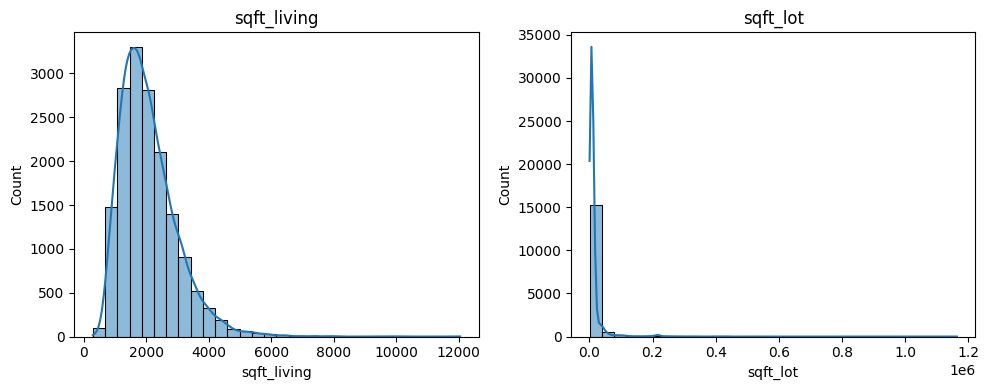

In [ ]:
plt.figure(figsize=(10,4))

for i, col in enumerate(continuous_cols, 1):
    plt.subplot(1, len(continuous_cols), i)
    sns.histplot(df[col], bins=30, kde=True)
    plt.title(col)

plt.tight_layout()
plt.show()


In [ ]:
def plot_feature_distribution(df, continuous, discrete):
    # Continuous
    for col in continuous:
        sns.histplot(df[col], bins=30, kde=True)
        plt.title(f"{col} (continuous)")
        plt.show()

    # Discrete
    for col in discrete:
        df[col].value_counts().sort_index().plot(kind="bar")
        plt.title(f"{col} (discrete)")
        plt.xlabel(col)
        plt.ylabel("Count")
        plt.show()


In [ ]:
discrete_cols = [
    "bedrooms",
    "bathrooms",
    "floors",
    "grade",
    "view",
    "condition"
]


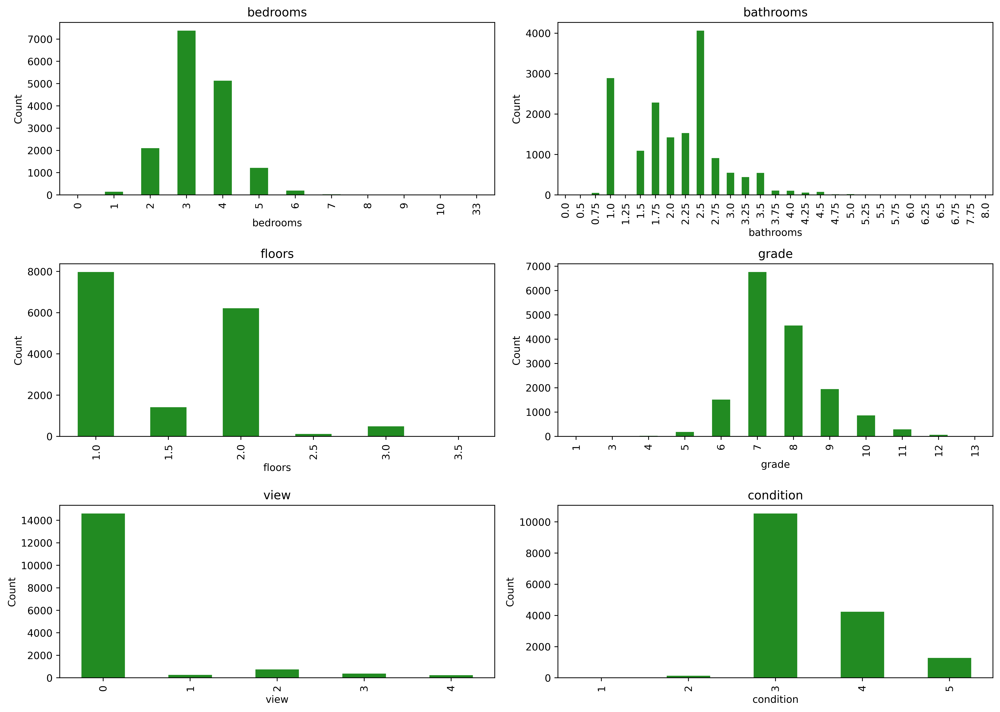

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14,10), dpi=500)

for i, col in enumerate(discrete_cols, 1):
    plt.subplot(3, 2, i)
    df[col].value_counts().sort_index().plot(kind="bar", color="#228B22")
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel("Count")

plt.tight_layout()
plt.show()

In [ ]:
'''
sqft_living and grade show wide variance → strong predictors.

bedrooms alone is weak unless combined with area-based features.

grade captures construction quality and correlates strongly with price.
'''

'\nsqft_living and grade show wide variance → strong predictors.\n\nbedrooms alone is weak unless combined with area-based features.\n\ngrade captures construction quality and correlates strongly with price.\n'

In [ ]:
'''
Living area and construction grade exhibit high variance and strong predictive potential,
 while bedroom count alone is insufficient to explain price variation.”
'''

'\n“Living area and construction grade exhibit high variance and strong predictive potential,\n while bedroom count alone is insufficient to explain price variation.”\n'

In [ ]:
'''
Discrete housing attributes such as bedrooms, floors, and construction grade exhibit clustered value distributions,
 indicating that treating them as categorical or ordinal features is more appropriate than continuous modeling.

Living area and lot size show wide continuous variation and skewness,
 motivating histogram-based inspection and logarithmic transformation.
 '''

'\nDiscrete housing attributes such as bedrooms, floors, and construction grade exhibit clustered value distributions,\n indicating that treating them as categorical or ordinal features is more appropriate than continuous modeling.\n\nLiving area and lot size show wide continuous variation and skewness,\n motivating histogram-based inspection and logarithmic transformation.\n '

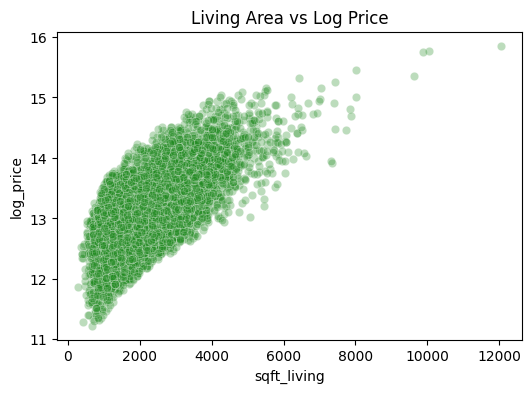

In [ ]:
plt.figure(figsize=(6,4))
sns.scatterplot(x=df["sqft_living"], y=df["log_price"], alpha=0.3, color="#228B22")
plt.title("Living Area vs Log Price")
plt.show()


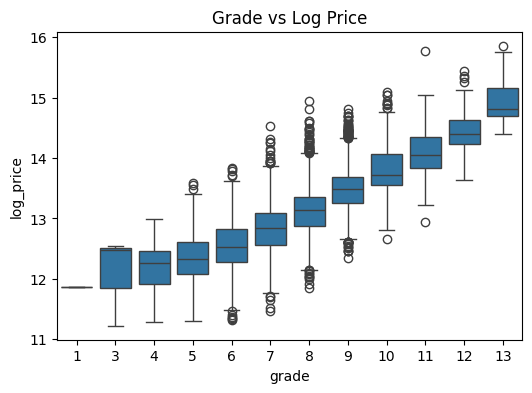

In [ ]:
plt.figure(figsize=(6,4))
sns.boxplot(x=df["grade"], y=df["log_price"])
plt.title("Grade vs Log Price")
plt.show()


In [ ]:
'''
sqft_living shows strong positive correlation with price.

Higher grades lead to non-linear jumps in price, indicating complex interactions.
'''


'\nsqft_living shows strong positive correlation with price.\n\nHigher grades lead to non-linear jumps in price, indicating complex interactions.\n'

In [ ]:
'''
Price increases non-linearly with construction grade,
suggesting the presence of higher-order interactions beyond linear effects.
 '''

'\n“Price increases non-linearly with construction grade,\n suggesting the presence of higher-order interactions beyond linear effects.”\n '

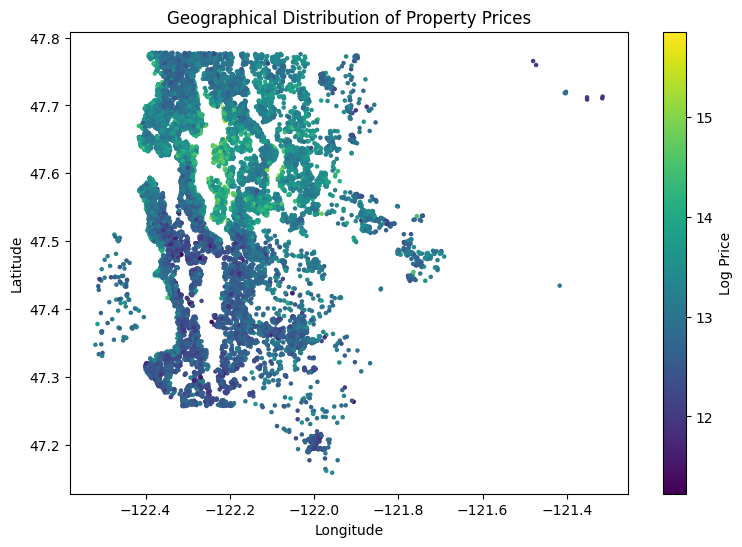

In [127]:
plt.figure(figsize=(9,6))
plt.scatter(df["long"], df["lat"], c=df["log_price"], cmap="viridis", s=5)
plt.colorbar(label="Log Price")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Geographical Distribution of Property Prices")
plt.show()


In [ ]:
'''
Clear spatial clustering of high-value properties.

Price is not uniform across geography → location matters deeply.

Justifies:

latitude/longitude usage

satellite imagery

CNN-based spatial understanding
'''

'\nClear spatial clustering of high-value properties.\n\nPrice is not uniform across geography → location matters deeply.\n\nJustifies:\n\nlatitude/longitude usage\n\nsatellite imagery\n\nCNN-based spatial understanding\n'

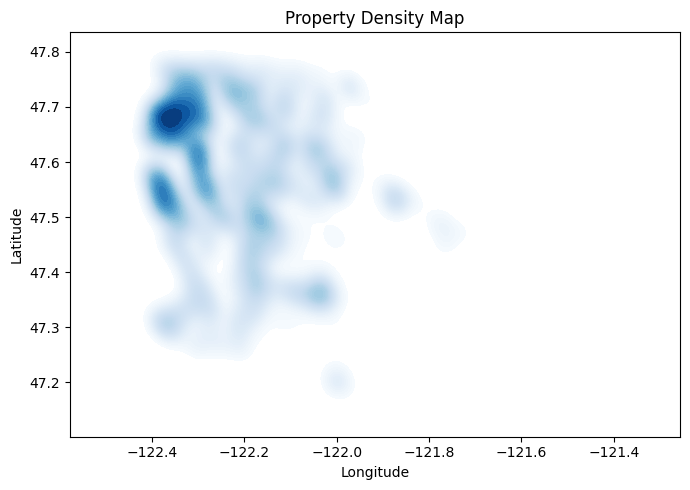

In [135]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(7,5))

sns.kdeplot(
    x=df["long"],
    y=df["lat"],
    fill=True,
    cmap="Blues",
    bw_adjust=0.7,
    levels=50,
    thresh=0.05
)

plt.title("Property Density Map")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()


## Correlation analysis

In [ ]:
from numpy._core import numeric
numeric_df = df.select_dtypes(include=[np.number])
numeric_df.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,log_price
0,9117000170,268643,4,2.25,1810,9240,2.00,0,0,3,...,1810,0,1961,0,98055,47.44,-122.19,1660,9240,12.50
1,6700390210,245000,3,2.50,1600,2788,2.00,0,0,4,...,1600,0,1992,0,98031,47.40,-122.19,1720,3605,12.41
2,7212660540,200000,4,2.50,1720,8638,2.00,0,0,3,...,1720,0,1994,0,98003,47.27,-122.31,1870,7455,12.21
3,8562780200,352499,2,2.25,1240,705,2.00,0,0,3,...,1150,90,2009,0,98027,47.53,-122.07,1240,750,12.77
4,7760400350,232000,3,2.00,1280,13356,1.00,0,0,3,...,1280,0,1994,0,98042,47.37,-122.07,1590,8071,12.35


In [ ]:
corr_matrix = numeric_df.corr()
corr_matrix.round(2)


,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,log_price
id,1.00,-0.02,0.01,0.01,-0.01,-0.14,0.02,-0.01,0.01,-0.03,...,-0.01,-0.01,0.03,-0.02,-0.01,-0.01,0.02,-0.00,-0.14,-0.01
price,-0.02,1.00,0.30,0.53,0.70,0.09,0.25,0.25,0.39,0.03,...,0.60,0.32,0.05,0.13,-0.05,0.31,0.02,0.58,0.08,0.89
bedrooms,0.01,0.30,1.00,0.51,0.57,0.03,0.17,-0.01,0.07,0.03,...,0.47,0.30,0.15,0.02,-0.15,-0.02,0.13,0.38,0.02,0.34
bathrooms,0.01,0.53,0.51,1.00,0.75,0.08,0.50,0.06,0.18,-0.13,...,0.68,0.28,0.50,0.05,-0.20,0.02,0.22,0.56,0.08,0.55
sqft_living,-0.01,0.70,0.57,0.75,1.00,0.17,0.35,0.09,0.27,-0.06,...,0.88,0.43,0.32,0.06,-0.20,0.05,0.24,0.75,0.17,0.69
sqft_lot,-0.14,0.09,0.03,0.08,0.17,1.00,-0.01,0.03,0.06,-0.01,...,0.18,0.01,0.05,0.02,-0.14,-0.08,0.25,0.16,0.72,0.10
floors,0.02,0.25,0.17,0.50,0.35,-0.01,1.00,0.01,0.02,-0.27,...,0.52,-0.25,0.50,0.01,-0.06,0.05,0.13,0.27,-0.01,0.31
waterfront,-0.01,0.25,-0.01,0.06,0.09,0.03,0.01,1.00,0.38,0.02,...,0.06,0.08,-0.04,0.09,0.03,-0.02,-0.04,0.07,0.03,0.16
view,0.01,0.39,0.07,0.18,0.27,0.06,0.02,0.38,1.00,0.05,...,0.16,0.27,-0.06,0.10,0.09,0.00,-0.09,0.28,0.06,0.34
condition,-0.03,0.03,0.03,-0.13,-0.06,-0.01,-0.27,0.02,0.05,1.00,...,-0.16,0.18,-0.36,-0.06,0.00,-0.02,-0.11,-0.10,-0.01,0.03


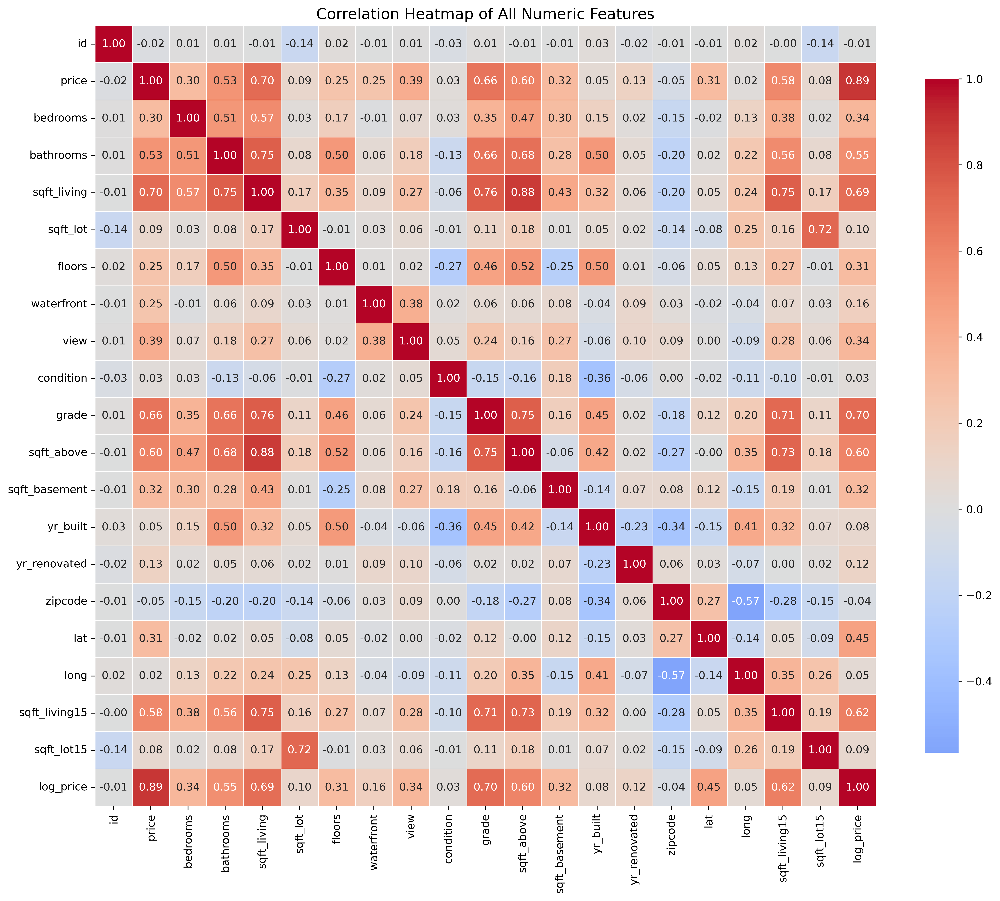

In [ ]:
plt.figure(figsize=(14,12), dpi=500)
sns.heatmap(
    corr_matrix,
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8},
    annot=True,
    fmt=".2f"
)
plt.title("Correlation Heatmap of All Numeric Features", fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
corr_with_price = corr_matrix["price"].sort_values(ascending=False)
corr_with_price

,price
price,1.00
log_price,0.89
sqft_living,0.70
grade,0.66
sqft_above,0.60
sqft_living15,0.58
bathrooms,0.53
view,0.39
sqft_basement,0.32
lat,0.31


In [ ]:
corr_with_log_price = corr_matrix["log_price"].sort_values(ascending=False)
corr_with_log_price


,log_price
log_price,1.00
price,0.89
grade,0.70
sqft_living,0.69
sqft_living15,0.62
sqft_above,0.60
bathrooms,0.55
lat,0.45
view,0.34
bedrooms,0.34


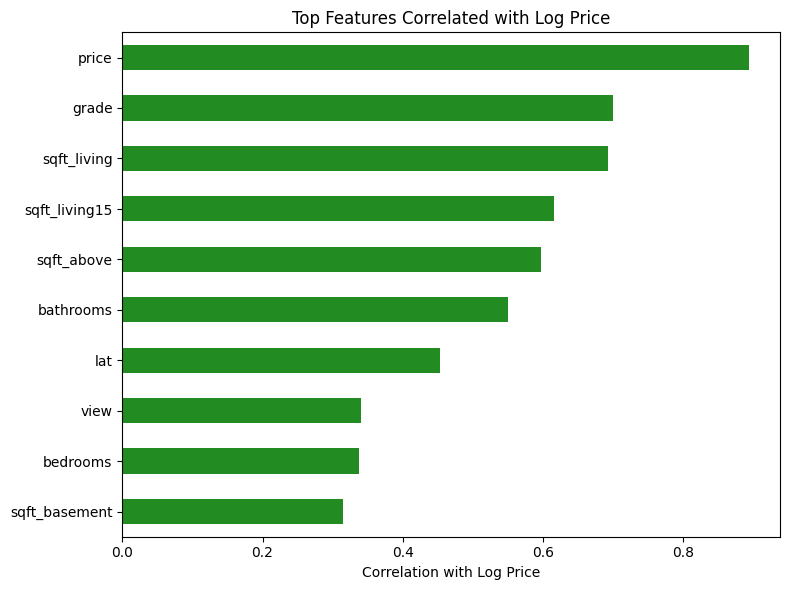

In [ ]:
plt.figure(figsize=(8,6))
corr_with_log_price.drop(["log_price"]).head(10).plot(kind="barh", color="#228B22")
plt.xlabel("Correlation with Log Price")
plt.title("Top Features Correlated with Log Price")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


In [ ]:
'''
Living area (sqft_living) and construction quality (grade) show the strongest positive correlation with house prices,
 confirming that physical size and build quality are primary price drivers.
'''

'\nLiving area (sqft_living) and construction quality (grade) show the strongest positive correlation with house prices,\n confirming that physical size and build quality are primary price drivers.\n'

In [ ]:
'''
Latitude and longitude exhibit moderate correlation with price,
 indicating strong spatial effects that are not fully captured through linear relationships.

This justifies satellite images + CNN
'''

'\nLatitude and longitude exhibit moderate correlation with price,\n indicating strong spatial effects that are not fully captured through linear relationships.\n\nThis justifies satellite images + CNN\n'

In [ ]:
'''
Bedroom count shows weaker correlation compared to living area,
 suggesting that raw room count alone is an insufficient proxy for property value.
 '''

'\nBedroom count shows weaker correlation compared to living area,\n suggesting that raw room count alone is an insufficient proxy for property value.\n '

In [ ]:
'''
Features such as view and condition exhibit limited linear correlation,
 indicating their influence is context-dependent and potentially non-linear.
 '''

'\nFeatures such as view and condition exhibit limited linear correlation,\n indicating their influence is context-dependent and potentially non-linear.\n '

In [ ]:
'''
While certain features such as living area and bathroom count are moderately correlated, no extreme multicollinearity is observed,
 supporting the use of multi-feature regression and deep learning models
 '''

'\nWhile certain features such as living area and bathroom count are moderately correlated, no extreme multicollinearity is observed,\n supporting the use of multi-feature regression and deep learning models\n '

In [ ]:
'''Correlation analysis reveals that property valuation is driven by a combination of size, quality, and spatial factors, with several features exhibiting non-linear relationships
 that motivate the use of multimodal and deep learning-based fusion models.
 '''

'Correlation analysis reveals that property valuation is driven by a combination of size, quality, and spatial factors, with several features exhibiting non-linear relationships\n that motivate the use of multimodal and deep learning-based fusion models.\n '

In [ ]:
# correlation with target
corr_with_log_price = corr_matrix["log_price"].drop("log_price")

# top 10 absolute correlations
top10_features = corr_with_log_price.abs().sort_values(ascending=False).head(10).index.tolist()

top10_features


['price',
 'grade',
 'sqft_living',
 'sqft_living15',
 'sqft_above',
 'bathrooms',
 'lat',
 'view',
 'bedrooms',
 'sqft_basement']

In [ ]:
continuous_feats = []
discrete_feats = []

for col in top10_features:
    unique_vals = df[col].nunique()
    if unique_vals > 20:   # heuristic
        continuous_feats.append(col)
    else:
        discrete_feats.append(col)

continuous_feats, discrete_feats


(['price',
  'sqft_living',
  'sqft_living15',
  'sqft_above',
  'bathrooms',
  'lat',
  'sqft_basement'],
 ['grade', 'view', 'bedrooms'])

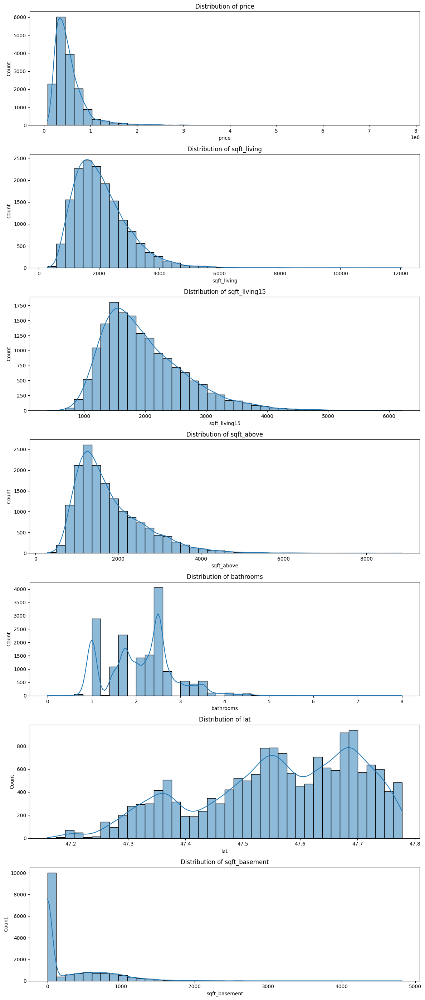

In [ ]:
plt.figure(figsize=(12, 4 * len(continuous_feats)))

for i, col in enumerate(continuous_feats, 1):
    plt.subplot(len(continuous_feats), 1, i)
    sns.histplot(df[col], bins=40, kde=True)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)

plt.tight_layout()
plt.show()


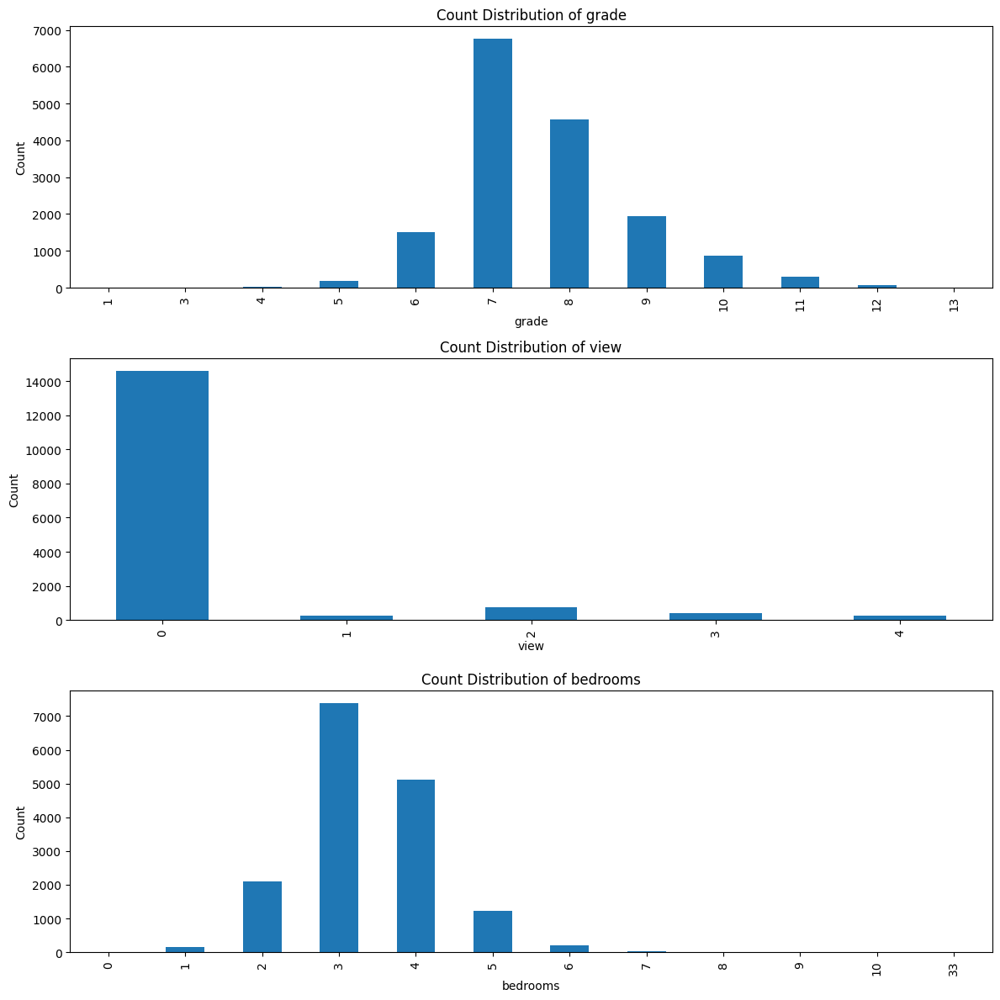

In [ ]:
plt.figure(figsize=(12, 4 * len(discrete_feats)))

for i, col in enumerate(discrete_feats, 1):
    plt.subplot(len(discrete_feats), 1, i)
    df[col].value_counts().sort_index().plot(kind="bar")
    plt.title(f"Count Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")

plt.tight_layout()
plt.show()


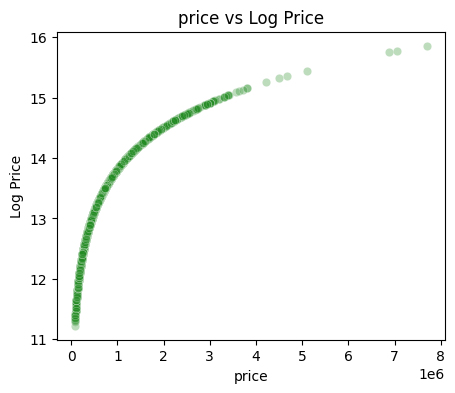

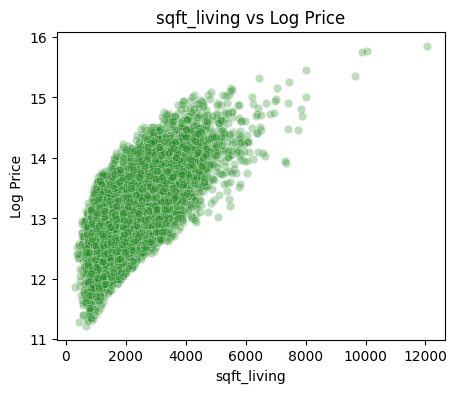

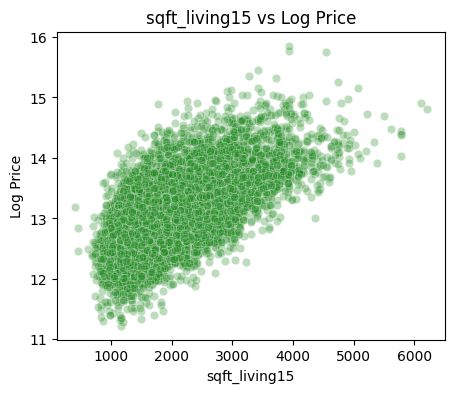

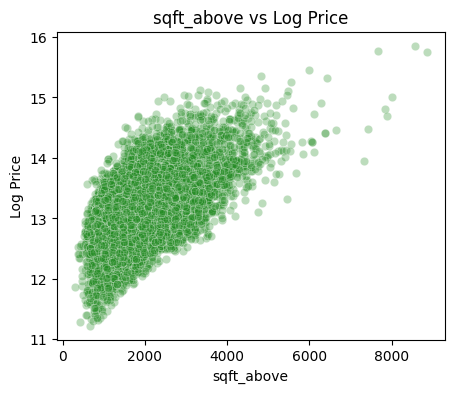

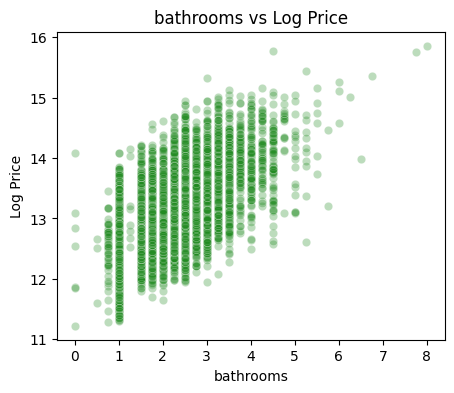

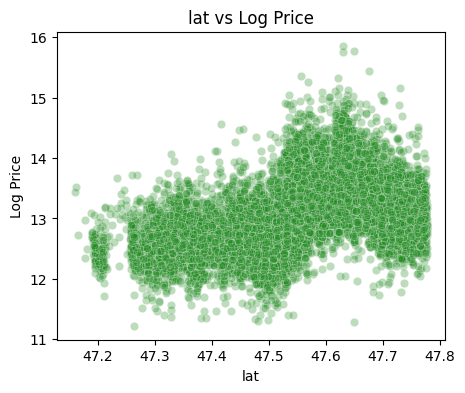

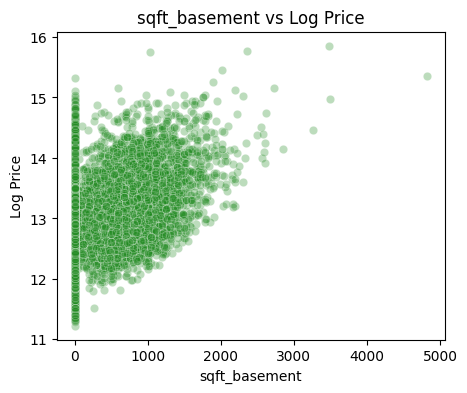

In [ ]:
for col in continuous_feats:
    plt.figure(figsize=(5,4))
    sns.scatterplot(x=df[col], y=df["log_price"], alpha=0.3, color="#228B22")
    plt.title(f"{col} vs Log Price")
    plt.xlabel(col)
    plt.ylabel("Log Price")
    plt.show()


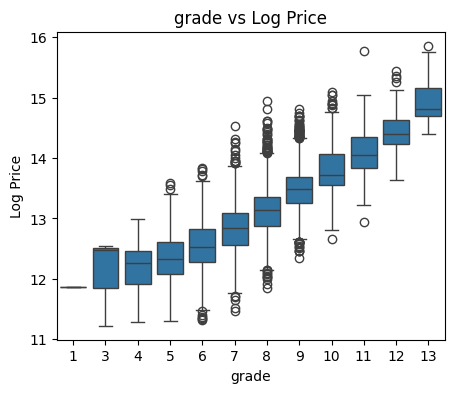

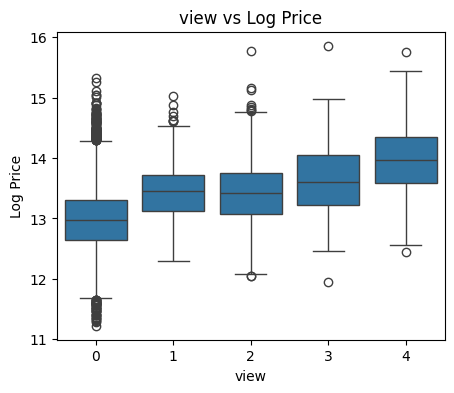

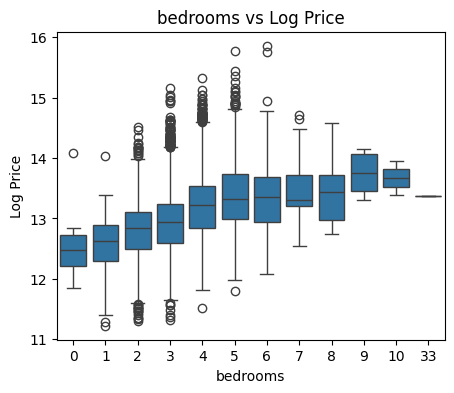

In [ ]:
for col in discrete_feats:
    plt.figure(figsize=(5,4))
    sns.boxplot(x=df[col], y=df["log_price"])
    plt.title(f"{col} vs Log Price")
    plt.xlabel(col)
    plt.ylabel("Log Price")
    plt.show()


In [ ]:
'''
The top correlated features exhibit distinct distributional characteristics.
 Continuous attributes such as living area and geographic coordinates show wide variance and skewness,
  while ordinal features such as grade and condition display clustered distributions.
   These patterns justify tailored preprocessing strategies and support the use of non-linear models.
'''

'\nThe top correlated features exhibit distinct distributional characteristics.\n Continuous attributes such as living area and geographic coordinates show wide variance and skewness,\n  while ordinal features such as grade and condition display clustered distributions.\n   These patterns justify tailored preprocessing strategies and support the use of non-linear models.\n'

In [ ]:
'''Exploratory analysis reveals that house prices are highly skewed, spatially clustered,
 and influenced by complex interactions between size, quality, and location.

Log-transformation of the target improves distributional properties,
 while geospatial patterns strongly justify the inclusion of satellite imagery for capturing neighborhood-level effects.

 These insights motivate a multimodal learning approach combining tabular and image-based features.
 '''

'Exploratory analysis reveals that house prices are highly skewed, spatially clustered,\n and influenced by complex interactions between size, quality, and location.\n\nLog-transformation of the target improves distributional properties,\n while geospatial patterns strongly justify the inclusion of satellite imagery for capturing neighborhood-level effects.\n\n These insights motivate a multimodal learning approach combining tabular and image-based features.\n '

# Feature Engineering

In [ ]:
X = df.drop(columns=["price", "date", "zipcode", "log_price","id"])
y_log = df["log_price"]     # y is log transformes column of price

In [ ]:
df.shape

(16209, 22)

In [ ]:
X.columns

Index(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [ ]:
y_log

,log_price
0,12.50
1,12.41
2,12.21
3,12.77
4,12.35
...,...
16204,12.84
16205,12.90
16206,13.26
16207,12.41


## Extracting Image Features using ResNet50

### Training Data

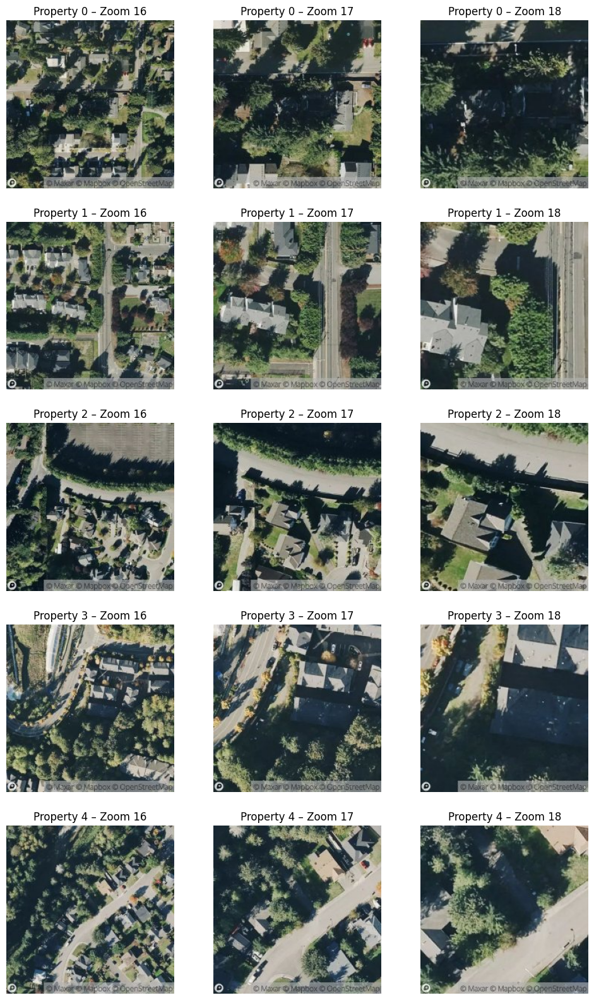

<Figure size 7200x12000 with 0 Axes>

In [144]:
# Checking the first 5 images visually of Training dataset for all zoom levels

TRAIN_IMAGE_DIR = "/content/drive/MyDrive/Satellite_Property_Valuation/train_images"

import matplotlib.pyplot as plt
from PIL import Image

zooms = [16, 17, 18]
indices = range(5)   # first 5 properties

plt.figure(figsize=(12, 4 * len(indices)))

plot_idx = 1

for idx in indices:
    for z in zooms:
        img_path = f"{TRAIN_IMAGE_DIR}/{idx}_z{z}.png"
        img = Image.open(img_path)

        plt.subplot(len(indices), len(zooms), plot_idx)
        plt.imshow(img)
        plt.title(f"Property {idx} – Zoom {z}")
        plt.axis("off")

        plot_idx += 1

plt.figure(figsize=(12, 4 * len(indices)), dpi=600)
plt.tight_layout()
plt.show()


In [ ]:
# Where individual features will be saved
FEATURE_Z16_DIR = "/content/drive/MyDrive/Satellite_Property_Valuation/features_z16"
FEATURE_Z17_DIR = "/content/drive/MyDrive/Satellite_Property_Valuation/features_z17"
FEATURE_Z18_DIR = "/content/drive/MyDrive/Satellite_Property_Valuation/features_z18"

os.makedirs(FEATURE_Z16_DIR, exist_ok=True)
os.makedirs(FEATURE_Z17_DIR, exist_ok=True)
os.makedirs(FEATURE_Z18_DIR, exist_ok=True)

IMG_SIZE = 224

In [ ]:
import os
import numpy as np
from PIL import Image
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tqdm import tqdm

In [ ]:
resnet = ResNet50(
    weights="imagenet",
    include_top=False,
    pooling="avg"
)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
def load_batch(image_paths):
    imgs = []
    for p in image_paths:
        img = Image.open(p).convert("RGB")
        img = img.resize((224, 224))
        imgs.append(np.array(img))

    imgs = np.array(imgs)
    imgs = preprocess_input(imgs)
    return imgs


In [ ]:
train_ids = sorted({
    int(f.split("_")[0])
    for f in os.listdir(TRAIN_IMAGE_DIR)
    if f.endswith("_z18.png")
})

NUM_TRAIN = len(train_ids)
print("✅ Total train samples:", NUM_TRAIN)


✅ Total train samples: 16209


In [ ]:
from tqdm import tqdm

# function for extracting features of train images for a particular zoom level
def extract_features_for_zoom_train(
    zoom_level,
    save_dir,
    batch_size=32
):
    os.makedirs(save_dir, exist_ok=True)

    print(f"\nExtracting TRAIN features for ZOOM {zoom_level}")

    for start in tqdm(
        range(0, NUM_TRAIN, batch_size),
        desc=f"Train Zoom-{zoom_level} batches"
    ):
        batch_paths = []
        batch_ids = []

        for idx in train_ids[start:start + batch_size]:
            img_path = f"{TRAIN_IMAGE_DIR}/{idx}_z{zoom_level}.png"
            feat_path = f"{save_dir}/{idx}.npy"

            # resume safe
            if os.path.exists(feat_path):
                continue
            if not os.path.exists(img_path):
                continue

            batch_paths.append(img_path)
            batch_ids.append(idx)

        if len(batch_paths) == 0:
            continue

        batch_imgs = load_batch(batch_paths)
        feats = resnet.predict(batch_imgs, verbose=0)

        for i, f in zip(batch_ids, feats):
            np.save(f"{save_dir}/{i}.npy", f)


In [ ]:
extract_features_for_zoom_train(
    zoom_level=16,
    save_dir="/content/drive/MyDrive/Satellite_Property_Valuation/features_z16"
)

extract_features_for_zoom_train(
    zoom_level=17,
    save_dir="/content/drive/MyDrive/Satellite_Property_Valuation/features_z17"
)

extract_features_for_zoom_train(
    zoom_level=18,
    save_dir="/content/drive/MyDrive/Satellite_Property_Valuation/features_z18"
)



Extracting TRAIN features for ZOOM 16


Train Zoom-16 batches: 100%|██████████| 507/507 [00:02<00:00, 179.39it/s]



Extracting TRAIN features for ZOOM 17


Train Zoom-17 batches: 100%|██████████| 507/507 [00:02<00:00, 169.32it/s]



Extracting TRAIN features for ZOOM 18


Train Zoom-18 batches: 100%|██████████| 507/507 [00:02<00:00, 171.19it/s]


In [ ]:
from tqdm import tqdm

def load_feature_matrix_train(feature_dir):
    X = np.zeros((NUM_TRAIN, 2048), dtype=np.float32)

    for i, idx in enumerate(
        tqdm(train_ids, desc=f"Loading {os.path.basename(feature_dir)}")
    ):
        X[i] = np.load(f"{feature_dir}/{idx}.npy")

    return X


In [ ]:
X_z16_train = load_feature_matrix_train(
    "/content/drive/MyDrive/Satellite_Property_Valuation/features_z16"
)

X_z17_train = load_feature_matrix_train(
    "/content/drive/MyDrive/Satellite_Property_Valuation/features_z17"
)

X_z18_train = load_feature_matrix_train(
    "/content/drive/MyDrive/Satellite_Property_Valuation/features_z18"
)


Loading features_z18: 100%|██████████| 16209/16209 [58:20<00:00,  4.63it/s]


In [ ]:
np.save("/content/drive/MyDrive/Satellite_Property_Valuation/X_z16_train.npy", X_z16_train)
np.save("/content/drive/MyDrive/Satellite_Property_Valuation/X_z17_train.npy", X_z17_train)
np.save("/content/drive/MyDrive/Satellite_Property_Valuation/X_z18_train.npy", X_z18_train)


### Testing Data

In [140]:
IMAGE_DIR_TEST = "/content/drive/MyDrive/Satellite_Property_Valuation/test_images"

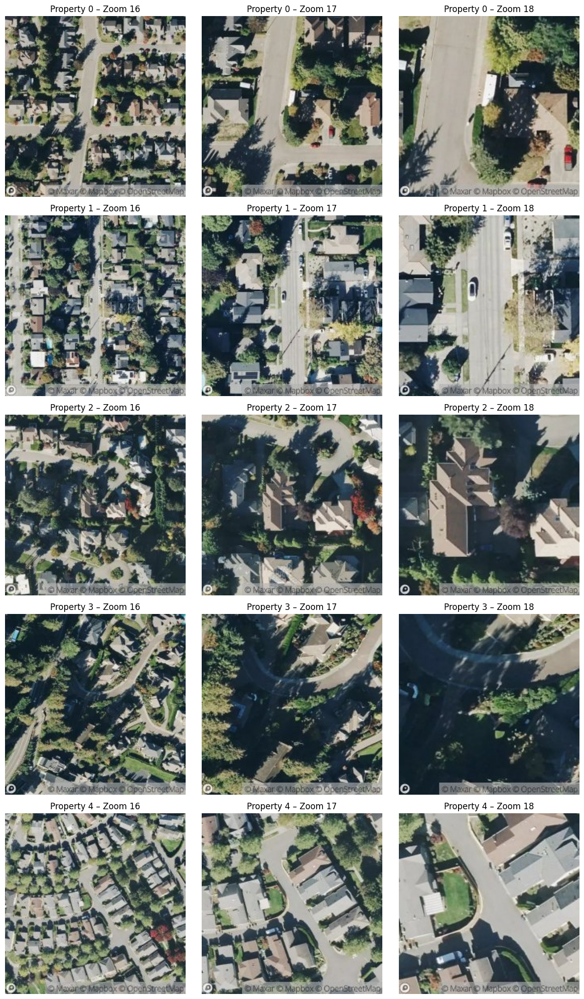

In [141]:
# Checking the first 5 images visually of Testing dataset for all zoom levels

import matplotlib.pyplot as plt
from PIL import Image

zooms = [16, 17, 18]
indices = range(5)   # first 5 properties

plt.figure(figsize=(12, 4 * len(indices)))

plot_idx = 1

for idx in indices:
    for z in zooms:
        img_path = f"{IMAGE_DIR_TEST}/{idx}_z{z}.png"
        img = Image.open(img_path)

        plt.subplot(len(indices), len(zooms), plot_idx)
        plt.imshow(img)
        plt.title(f"Property {idx} – Zoom {z}")
        plt.axis("off")

        plot_idx += 1

plt.tight_layout()
plt.show()


In [ ]:
# Where individual features will be saved
FEATURE_Z16_DIR = "/content/drive/MyDrive/Satellite_Property_Valuation/test_features_z16"
FEATURE_Z17_DIR = "/content/drive/MyDrive/Satellite_Property_Valuation/test_features_z17"
FEATURE_Z18_DIR = "/content/drive/MyDrive/Satellite_Property_Valuation/test_features_z18"

os.makedirs(FEATURE_Z16_DIR, exist_ok=True)
os.makedirs(FEATURE_Z17_DIR, exist_ok=True)
os.makedirs(FEATURE_Z18_DIR, exist_ok=True)

IMG_SIZE = 224

In [ ]:
test_ids = sorted({
    int(f.split("_")[0])
    for f in os.listdir(IMAGE_DIR_TEST)
    if f.endswith("_z18.png")
})

NUM_TEST = len(test_ids)
print("Total test samples:", NUM_TEST)

Total test samples: 5404


In [ ]:
print(resnet)
print(load_batch)

<Functional name=resnet50, built=True>
<function load_batch at 0x7c3000ba0cc0>


In [ ]:
from tqdm import tqdm

# function for extracting features of test images for a particular zoom level
def extract_features_for_zoom_test(
    zoom_level,
    save_dir,
    batch_size=32
):
    os.makedirs(save_dir, exist_ok=True)

    print(f"\n🚀 Extracting TEST features for ZOOM {zoom_level}")

    # tqdm over batches
    for start in tqdm(
        range(0, NUM_TEST, batch_size),
        desc=f"Zoom-{zoom_level} batches"
    ):
        batch_paths = []
        batch_ids = []

        for idx in test_ids[start:start + batch_size]:
            img_path = f"{TEST_IMAGE_DIR}/{idx}_z{zoom_level}.png"
            feat_path = f"{save_dir}/{idx}.npy"

            # resume safe
            if os.path.exists(feat_path):
                continue
            if not os.path.exists(img_path):
                continue

            batch_paths.append(img_path)
            batch_ids.append(idx)

        if len(batch_paths) == 0:
            continue

        batch_imgs = load_batch(batch_paths)
        feats = resnet.predict(batch_imgs, verbose=0)

        for i, f in zip(batch_ids, feats):
            np.save(f"{save_dir}/{i}.npy", f)


In [ ]:
extract_features_for_zoom_test(
    zoom_level=16,
    save_dir="/content/drive/MyDrive/Satellite_Property_Valuation/test_features_z16"
)

extract_features_for_zoom_test(
    zoom_level=17,
    save_dir="/content/drive/MyDrive/Satellite_Property_Valuation/test_features_z17"
)

extract_features_for_zoom_test(
    zoom_level=18,
    save_dir="/content/drive/MyDrive/Satellite_Property_Valuation/test_features_z18"
)


🚀 Extracting TEST features for ZOOM 16


Zoom-16 batches: 100%|██████████| 169/169 [00:01<00:00, 95.27it/s] 



🚀 Extracting TEST features for ZOOM 17


Zoom-17 batches: 100%|██████████| 169/169 [00:01<00:00, 147.50it/s]



🚀 Extracting TEST features for ZOOM 18


Zoom-18 batches: 100%|██████████| 169/169 [00:01<00:00, 142.67it/s]


In [ ]:
from tqdm import tqdm

def load_feature_matrix(feature_dir):
    X = np.zeros((NUM_TEST, 2048), dtype=np.float32)

    for i, idx in enumerate(
        tqdm(test_ids, desc=f"Loading {os.path.basename(feature_dir)}")
    ):
        X[i] = np.load(f"{feature_dir}/{idx}.npy")

    return X


In [ ]:
X_test_z16 = load_feature_matrix(
    "/content/drive/MyDrive/Satellite_Property_Valuation/test_features_z16"
)

X_test_z17 = load_feature_matrix(
    "/content/drive/MyDrive/Satellite_Property_Valuation/test_features_z17"
)

X_test_z18 = load_feature_matrix(
    "/content/drive/MyDrive/Satellite_Property_Valuation/test_features_z18"
)


Loading test_features_z18: 100%|██████████| 5404/5404 [20:54<00:00,  4.31it/s]


In [ ]:
np.save("/content/drive/MyDrive/Satellite_Property_Valuation/X_test_z16.npy", X_test_z16)
np.save("/content/drive/MyDrive/Satellite_Property_Valuation/X_test_z17.npy", X_test_z17)
np.save("/content/drive/MyDrive/Satellite_Property_Valuation/X_test_z18.npy", X_test_z18)

print("Test feature matrices saved")


Test feature matrices saved


In [ ]:
list(df.columns)

['id',
 'date',
 'price',
 'bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15',
 'log_price']

In [ ]:
tabular_features = list(df.columns)

tabular_features.remove("id")
tabular_features.remove("date")
tabular_features.remove("price")
tabular_features.remove("zipcode")
tabular_features.remove("log_price")

tabular_features

['bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15']

In [ ]:
X_tab = df[tabular_features]
y_log_price = df["log_price"]

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_tab_scaled = scaler.fit_transform(X_tab)

In [ ]:
print(X_tab_scaled, '\n')
print(y_log_price)

[[ 0.67740215  0.17896268 -0.2902756  ...  0.19275876 -0.47391081
  -0.12979094]
 [-0.3941321   0.50566682 -0.52181284 ...  0.19275876 -0.38591932
  -0.33901903]
 [ 0.67740215  0.50566682 -0.38950585 ... -0.70666908 -0.1659406
  -0.19606816]
 ...
 [-0.3941321   0.50566682  0.05151748 ...  1.29919776 -0.42991507
  -0.37447827]
 [-2.53720059 -1.78126215 -1.86693398 ... -0.77805224 -1.19250798
   0.0840784 ]
 [ 0.67740215  0.50566682  1.16510137 ...  0.82093058  1.52056295
  -0.25020384]] 

0        12.501142
1        12.409018
2        12.206078
3        12.772806
4        12.354497
           ...    
16204    12.842652
16205    12.899097
16206    13.262127
16207    12.409018
16208    12.660331
Name: log_price, Length: 16209, dtype: float64


In [ ]:
print(X_tab_scaled.shape)
print(y_log_price.shape)

(16209, 17)
(16209,)


In [ ]:
import numpy as np

# Image features
X_z16 = np.load("/content/drive/MyDrive/Satellite_Property_Valuation/X_z16_train.npy")
X_z17 = np.load("/content/drive/MyDrive/Satellite_Property_Valuation/X_z17_train.npy")
X_z18 = np.load("/content/drive/MyDrive/Satellite_Property_Valuation/X_z18_train.npy")


In [ ]:
from sklearn.model_selection import train_test_split

indices = np.arange(len(y))

train_idx, val_idx = train_test_split(
    indices,
    test_size=0.2,
    random_state=42
)


In [ ]:
X_tab_train = X_tab_scaled[train_idx]
X_tab_val   = X_tab_scaled[val_idx]

In [ ]:
X_z16_train = X_z16[train_idx]
X_z16_val   = X_z16[val_idx]

X_z17_train = X_z17[train_idx]
X_z17_val   = X_z17[val_idx]

X_z18_train = X_z18[train_idx]
X_z18_val   = X_z18[val_idx]


In [ ]:
y_train_log = y_log_price[train_idx]
y_val_log   = y_log_price[val_idx]


In [ ]:
import os

BASE_DIR = "/content/drive/MyDrive/Satellite_Property_Valuation"

dirs = [
    "processed/tabular",
    "processed/image_z16",
    "processed/image_z17",
    "processed/image_z18",
    "processed/targets"
]

for d in dirs:
    os.makedirs(os.path.join(BASE_DIR, d), exist_ok=True)


In [ ]:
np.save(f"{BASE_DIR}/processed/tabular/X_train.npy", X_tab_train)
np.save(f"{BASE_DIR}/processed/tabular/X_val.npy",   X_tab_val)

In [ ]:
np.save(f"{BASE_DIR}/processed/image_z16/X_train.npy", X_z16_train)
np.save(f"{BASE_DIR}/processed/image_z16/X_val.npy",   X_z16_val)

np.save(f"{BASE_DIR}/processed/image_z17/X_train.npy", X_z17_train)
np.save(f"{BASE_DIR}/processed/image_z17/X_val.npy",   X_z17_val)

np.save(f"{BASE_DIR}/processed/image_z18/X_train.npy", X_z18_train)
np.save(f"{BASE_DIR}/processed/image_z18/X_val.npy",   X_z18_val)

In [ ]:
np.save(f"{BASE_DIR}/processed/targets/y_train_log.npy", y_train_log)
np.save(f"{BASE_DIR}/processed/targets/y_val_log.npy",   y_val_log)

In [ ]:
print("Saved datasets:")
print("Tabular:", X_tab_train.shape, X_tab_val.shape)
print("Z16:", X_z16_train.shape, X_z16_val.shape)
print("Z17:", X_z17_train.shape, X_z17_val.shape)
print("Z18:", X_z18_train.shape, X_z18_val.shape)
print("Targets:", y_train_log.shape, y_val_log.shape)

Saved datasets:
Tabular: (12967, 17) (3242, 17)
Z16: (12967, 2048) (3242, 2048)
Z17: (12967, 2048) (3242, 2048)
Z18: (12967, 2048) (3242, 2048)
Targets: (12967,) (3242,)


##Importing the Test Data and Scaling the Tabular features

In [ ]:
df_test = pd.read_csv("/content/drive/MyDrive/Satellite_Property_Valuation/data/test2(test(1)).csv")

In [ ]:
df_test.head()

,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,2591820310,20141006T000000,4,2.25,2070,8893,2.0,0,0,4,8,2070,0,1986,0,98058,47.4388,-122.162,2390,7700
1,7974200820,20140821T000000,5,3.00,2900,6730,1.0,0,0,5,8,1830,1070,1977,0,98115,47.6784,-122.285,2370,6283
2,7701450110,20140815T000000,4,2.50,3770,10893,2.0,0,2,3,11,3770,0,1997,0,98006,47.5646,-122.129,3710,9685
3,9522300010,20150331T000000,3,3.50,4560,14608,2.0,0,2,3,12,4560,0,1990,0,98034,47.6995,-122.228,4050,14226
4,9510861140,20140714T000000,3,2.50,2550,5376,2.0,0,0,3,9,2550,0,2004,0,98052,47.6647,-122.083,2250,4050


In [ ]:
df_test.shape

(5404, 20)

In [ ]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5404 entries, 0 to 5403
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             5404 non-null   int64  
 1   date           5404 non-null   object 
 2   bedrooms       5404 non-null   int64  
 3   bathrooms      5404 non-null   float64
 4   sqft_living    5404 non-null   int64  
 5   sqft_lot       5404 non-null   int64  
 6   floors         5404 non-null   float64
 7   waterfront     5404 non-null   int64  
 8   view           5404 non-null   int64  
 9   condition      5404 non-null   int64  
 10  grade          5404 non-null   int64  
 11  sqft_above     5404 non-null   int64  
 12  sqft_basement  5404 non-null   int64  
 13  yr_built       5404 non-null   int64  
 14  yr_renovated   5404 non-null   int64  
 15  zipcode        5404 non-null   int64  
 16  lat            5404 non-null   float64
 17  long           5404 non-null   float64
 18  sqft_liv

In [ ]:
df.isna().sum()

,0
id,0
date,0
price,0
bedrooms,0
bathrooms,0
sqft_living,0
sqft_lot,0
floors,0
waterfront,0
view,0


In [ ]:
df_test.describe()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00,5404.00
mean,4593891086.78,3.38,2.12,2099.77,15824.72,1.48,0.01,0.23,3.41,7.67,1799.30,300.47,1970.56,89.39,98077.83,47.56,-122.21,1996.75,12867.09
std,2882493109.50,0.92,0.78,951.72,48372.74,0.53,0.10,0.78,0.65,1.19,846.60,454.22,29.37,412.92,53.96,0.14,0.14,695.71,28390.29
min,1000102.00,0.00,0.00,384.00,572.00,1.00,0.00,0.00,1.00,4.00,384.00,0.00,1900.00,0.00,98001.00,47.16,-122.52,620.00,659.00
25%,2123814112.75,3.00,1.75,1420.00,5169.25,1.00,0.00,0.00,3.00,7.00,1180.00,0.00,1951.00,0.00,98032.00,47.47,-122.33,1490.00,5173.00
50%,3904901520.00,3.00,2.25,1930.00,7680.00,1.00,0.00,0.00,3.00,7.00,1560.00,0.00,1974.00,0.00,98065.00,47.57,-122.23,1840.00,7650.00
75%,7338000312.50,4.00,2.50,2560.00,10812.75,2.00,0.00,0.00,4.00,8.00,2250.00,580.00,1996.00,0.00,98118.00,47.68,-122.12,2370.00,10144.75
max,9842300095.00,11.00,8.00,13540.00,1651359.00,3.50,1.00,4.00,5.00,13.00,9410.00,4130.00,2015.00,2015.00,98199.00,47.78,-121.31,5790.00,858132.00


In [ ]:
df_test.columns

Index(['id', 'date', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [ ]:
tabular_features

['bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15']

In [ ]:
X_tab_test = df_test[tabular_features]
X_tab_test

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15
0,4,2.25,2070,8893,2.00,0,0,4,8,2070,0,1986,0,47.44,-122.16,2390,7700
1,5,3.00,2900,6730,1.00,0,0,5,8,1830,1070,1977,0,47.68,-122.28,2370,6283
2,4,2.50,3770,10893,2.00,0,2,3,11,3770,0,1997,0,47.56,-122.13,3710,9685
3,3,3.50,4560,14608,2.00,0,2,3,12,4560,0,1990,0,47.70,-122.23,4050,14226
4,3,2.50,2550,5376,2.00,0,0,3,9,2550,0,2004,0,47.66,-122.08,2250,4050
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5399,4,2.50,2820,15000,2.00,0,0,4,9,2820,0,1985,0,47.73,-122.10,2440,15000
5400,3,2.00,1460,6250,1.50,0,0,4,7,1460,0,1912,0,47.67,-122.33,1690,4750
5401,3,2.50,2070,9900,1.00,0,0,3,8,1420,650,1979,0,47.30,-122.37,2070,8250
5402,4,2.25,4760,8036,2.50,0,0,5,9,3390,1370,1916,0,47.64,-122.28,2950,9323


In [ ]:
X_tab_test_scaled = scaler.transform(X_tab_test)

In [ ]:
import numpy as np
# saving the tabular test scaled features
np.save('/content/drive/MyDrive/Satellite_Property_Valuation/X_tab_test_scaled/X_tab_test_scaled.npy', X_tab_test_scaled)

print("Tabular Test Features saved successfully!")

Tabular Test Features saved successfully!
